# CitiBike Final Dashboard


## 01. Libraries/Imports

In [1]:
import streamlit as st
import pandas as pd
import numpy as np
import plotly.express as px
from plotly.subplots import make_subplots
import plotly.graph_objects as go
import matplotlib.pyplot as plt
from datetime import datetime as dt
from streamlit_keplergl import keplergl_static

C:\Users\Chase\anaconda3\envs\CitiBike\Lib\site-packages\keplergl\keplergl.py:2: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  from pkg_resources import resource_string


In [2]:
# Import MAIN dataset csv
ny_data_merged_v2 = pd.read_csv("02_Data/Prepared_Data/Old/ny_data_merged_v2.csv")

C:\Users\Chase\AppData\Local\Temp\ipykernel_31084\1980786483.py:2: DtypeWarning: Columns (5,7) have mixed types. Specify dtype option on import or set low_memory=False.
  ny_data_merged_v2 = pd.read_csv("02_Data/Prepared_Data/Old/ny_data_merged_v2.csv")


In [4]:
# Import Secondary dataset csv
tripdur_focus = pd.read_csv("02_Data/Prepared_Data/Old/tripduration_focus.csv")

In [3]:
# Import top 20 stations dataset csv
top20 = pd.read_csv("02_Data/Prepared_Data/top_stations_df.csv")

In [5]:
# Import Trip Duration sample 500k
tripdur_sample_500k = pd.read_csv("02_Data/Prepared_Data/Old/tripdur_sample_500k.csv")

## 02. Data Inspection

### Main

In [6]:
ny_data_merged_v2.shape

(29838166, 19)

In [7]:
ny_data_merged_v2.head()

,ride_id,rideable_type,started_at,ended_at,start_station_name,start_station_id,end_station_name,end_station_id,start_lat,start_lng,end_lat,end_lng,member_casual,date,avgTemp,_merge,bike_rides_daily,value,tripduration
0,4A091640AEC83471,classic_bike,2022-01-01 16:01:22.082,2022-01-01 16:05:11.986,S 4 St & Wythe Ave,5204.05,Kent Ave & S 11 St,5062.01,40.712859,-73.965903,40.707645,-73.968415,member,2022-01-01,11.6,both,20428,1,3.831733
1,7A560D6287C00126,classic_bike,2022-01-01 14:07:04.344,2022-01-01 14:31:57.500,Lexington Ave & E 120 St,7652.04,Amsterdam Ave & W 125 St,7800.03,40.801307,-73.939817,40.813358,-73.956461,member,2022-01-01,11.6,both,20428,1,24.885933
2,4F6F726B809C15E4,classic_bike,2022-01-01 12:02:26.943,2022-01-01 12:14:13.555,Lexington Ave & E 120 St,7652.04,Amsterdam Ave & W 125 St,7800.03,40.801307,-73.939817,40.813358,-73.956461,member,2022-01-01,11.6,both,20428,1,11.776867
3,3BC10DC94FD79955,classic_bike,2022-01-01 22:53:23.508,2022-01-01 23:18:42.881,Cleveland Pl & Spring St,5492.05,Mott St & Prince St,5561.04,40.722104,-73.997249,40.723180,-73.994800,member,2022-01-01,11.6,both,20428,1,25.322883
4,FE4CE7F1CFFD7952,classic_bike,2022-01-01 08:04:51.755,2022-01-01 08:08:07.290,Central Park North & Adam Clayton Powell Blvd,7617.07,E 110 St & Madison Ave,7587.14,40.799484,-73.955613,40.796154,-73.947821,member,2022-01-01,11.6,both,20428,1,3.258917


In [8]:
ny_data_merged_v2.columns

Index(['ride_id', 'rideable_type', 'started_at', 'ended_at',
       'start_station_name', 'start_station_id', 'end_station_name',
       'end_station_id', 'start_lat', 'start_lng', 'end_lat', 'end_lng',
       'member_casual', 'date', 'avgTemp', '_merge', 'bike_rides_daily',
       'value', 'tripduration'],
      dtype='object')

### tripdur_focus

In [9]:
tripdur_focus.shape

(29371361, 3)

In [10]:
tripdur_focus.head()

,member_casual,tripduration,date
0,member,3.831733,2022-01-01
1,member,24.885933,2022-01-01
2,member,11.776867,2022-01-01
3,member,25.322883,2022-01-01
4,member,3.258917,2022-01-01


In [11]:
tripdur_focus.dtypes

member_casual     object
tripduration     float64
date              object
dtype: object

In [12]:
tripdur_focus.columns

Index(['member_casual', 'tripduration', 'date'], dtype='object')

### Change date to Datetime

In [28]:
# Change the 'date' column to date-time
tripdur_focus['date'] = pd.to_datetime(tripdur_focus['date'], errors='coerce')

In [29]:
# Work check
tripdur_focus['date'].dtype

dtype('<M8[ns]')

In [30]:
# Double check the dates to ensure no year anomailes
tripdur_focus['date'].dt.year.unique()

array([2022], dtype=int32)

## 03. Random Data Sample

#### Main Dataset Wrangle

In [14]:
# Drop the column _merge, it isn't useful for the data sample
ny_data_merged_v2 = ny_data_merged_v2.drop(columns=["_merge"])

In [18]:
# Work check
ny_data_merged_v2.columns

Index(['ride_id', 'rideable_type', 'started_at', 'ended_at',
       'start_station_name', 'start_station_id', 'end_station_name',
       'end_station_id', 'start_lat', 'start_lng', 'end_lat', 'end_lng',
       'member_casual', 'date', 'avgTemp', 'bike_rides_daily', 'value',
       'tripduration'],
      dtype='object')

#### Take Sample

In [24]:
# Take a random sample of 500k rows
citibike_sample_100k = ny_data_merged_v2.sample(n=100000)

In [25]:
citibike_sample_100k.shape

(100000, 18)

In [26]:
citibike_sample_100k.head()

,ride_id,rideable_type,started_at,ended_at,start_station_name,start_station_id,end_station_name,end_station_id,start_lat,start_lng,end_lat,end_lng,member_casual,date,avgTemp,bike_rides_daily,value,tripduration
21524217,1B7617CCA78EE1B3,electric_bike,2022-09-18 16:56:51.124,2022-09-18 17:21:15.788,South St & Gouverneur Ln,4953.04,1 Ave & E 6 St,5626.15,40.703554,-74.006702,40.726331,-73.986169,casual,2022-09-18,23.4,116749,1,24.411067
20263356,420C90D42AB1CE87,classic_bike,2022-09-08 11:08:16.616,2022-09-08 11:15:43.287,W 13 St & 5 Ave,5947.04,W 27 St & 7 Ave,6247.06,40.735445,-73.994310,40.746647,-73.993915,casual,2022-09-08,21.8,134611,1,7.444517
26430773,AFF1A336DF6ED629,classic_bike,2022-11-05 19:14:01.569,2022-11-05 19:20:32.961,Henry St & Remsen St,4645.04,Warren St & Court St,4413.08,40.694010,-73.994651,40.686371,-73.993833,casual,2022-11-05,19.4,122101,1,6.523200
24223201,EB53C656A8046E03,electric_bike,2022-10-15 13:39:23.198,2022-10-15 14:08:37.673,Van Brunt St & Van Dyke St,4095.1,Bayard St & Baxter St,5351.03,40.675932,-74.014669,40.716021,-73.999744,member,2022-10-15,16.2,118062,1,29.241250
21106994,00EB8F31E518ABAB,classic_bike,2022-09-15 19:12:02.898,2022-09-15 19:24:03.013,W 13 St & 5 Ave,5947.04,6 Ave & W 33 St,6364.07,40.735445,-73.994310,40.749013,-73.988484,member,2022-09-15,21.8,132381,1,12.001917


#### Export

In [27]:
# Export
citibike_sample_100k.to_csv("02_Data/Prepared_Data/citibike_sample_100k.csv", index=False)

## 04. Trip Duration Box Plot

### Take Trip Duration Sample

In [33]:
# Sample of 500k
tripdur_sample_500k = tripdur_focus.sample(n=500000)

In [34]:
# Work check
tripdur_sample_500k.shape

(500000, 3)

In [40]:
tripdur_sample_500k.head()

,member_casual,tripduration,date
0,member,4.463300,2022-11-29
1,member,4.152950,2022-06-05
2,casual,21.887033,2022-01-06
3,casual,22.722267,2022-09-02
4,casual,5.358833,2022-07-07


In [36]:
# Export
tripdur_sample_500k.to_csv("02_Data/Prepared_Data/tripdur_sample_500k.csv", index=False)

#### Plot

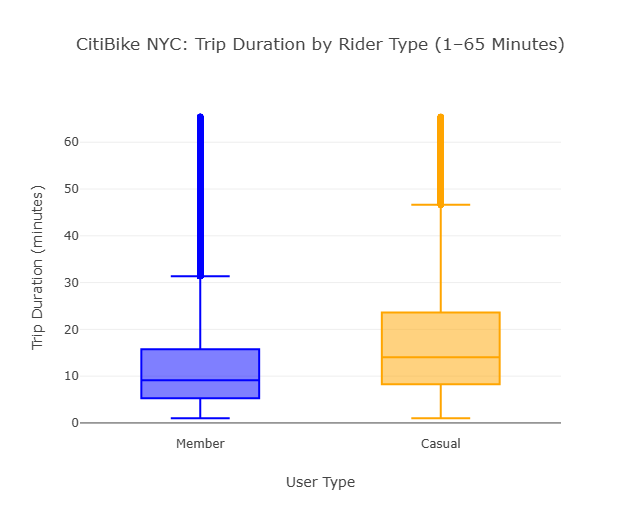

In [6]:
# Capitalize category labels
tripdur_sample_500k["member_casual"] = (
    tripdur_sample_500k["member_casual"].str.capitalize()
)

# Plot

fig = px.box(
    tripdur_sample_500k,
    x="member_casual",
    y="tripduration",
    color="member_casual",
    points="outliers",
    color_discrete_sequence=["blue", "orange"],
    title="CitiBike NYC: Trip Duration by Rider Type (1–65 Minutes)"
)

fig.update_layout(
    xaxis_title="User Type",
    yaxis_title="Trip Duration (minutes)",
    showlegend=False,
    height=500,
    width=900
)

# Save Static Chart

fig.write_image(
    "04_Analysis/Visualizations/tripduration_boxplot_static.png",
    scale=3
)

fig.show(config={'staticPlot': True})

In [39]:
tripdur_sample_500k.describe()

,tripduration
count,500000.000000
mean,13.300928
std,10.754315
min,1.001633
25%,5.753233
50%,10.005917
75%,17.429700
max,65.446250


## 05. Bar Chart rework

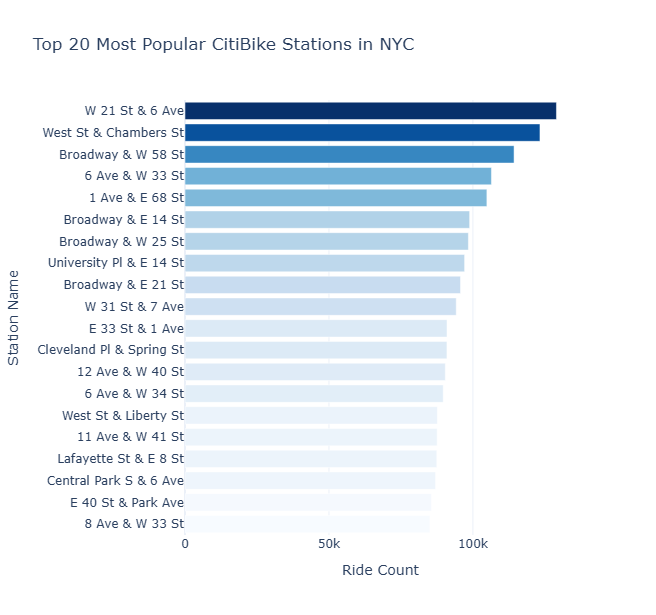

In [8]:
top20_sorted = top20.sort_values("value", ascending=True)

fig = go.Figure(go.Bar(
    x=top20_sorted["value"],                 
    y=top20_sorted["start_station_name"],   
    orientation="h",
    marker=dict(
        color=top20_sorted["value"],
        colorscale="Blues",
        reversescale=False
    )
))

fig.update_layout(
    title="Top 20 Most Popular CitiBike Stations in NYC",
    xaxis_title="Ride Count",
    yaxis_title="Station Name",
    width=900,
    height=600,
    template="plotly_white"
)

fig.show()
